In [25]:
## Importing relevant libraries

import numpy as np
import math
from itertools import product
import cv2
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
from scipy.ndimage import zoom
from scipy.signal import convolve2d
from scipy.ndimage import median_filter
from scipy import fftpack
from PIL import Image, ImageDraw
from scipy import ndimage

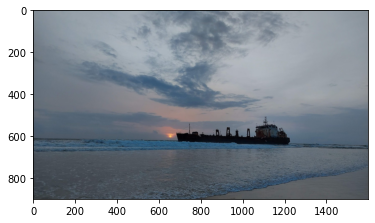

In [26]:
## Loading the image

img = mpimg.imread('img1.jpg')
plt.imshow(img)
plt.show()

In [27]:
## Image Properties

if len(img.shape) == 3:
    height, width, channels = img.shape
else:
    height, width = img.shape
    channels = 1
print(f"Height: {height}, Width: {width}, Channels: {channels}")

Height: 901, Width: 1600, Channels: 3


## PART 1

#### Contrasting:

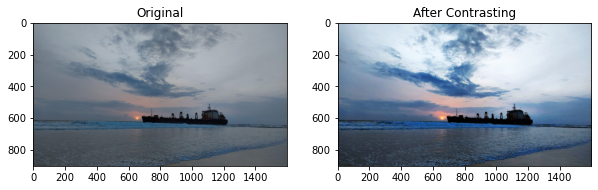

In [28]:
def contrasting(orig_img, bins=256):
    img_flattened = orig_img.flatten()
    img_hist = np.zeros(bins)

    for pix in orig_img:
        img_hist[pix] += 1  # frequency count of each pixel

    cum_sum = np.cumsum(img_hist)   # cumulative sum
    norm = (cum_sum - cum_sum.min()) * 255
    n_ = cum_sum.max() - cum_sum.min()
    uniform_norm = norm / n_  # normalization of the pixel values
    uniform_norm = uniform_norm.astype('int')

    img_con = uniform_norm[img_flattened]  # flat histogram
    img_con = np.reshape(a=img_con, newshape=orig_img.shape)  # reshaping the flattened matrix to its original shape
    
    fig = plt.figure(figsize=(10, 20))
    ax1 = fig.add_subplot(2, 2, 1)
    ax1.title.set_text('Original')
    ax2 = fig.add_subplot(2, 2, 2)
    ax2.title.set_text("After Contrasting")
    ax1.imshow(orig_img)
    ax2.imshow(img_con)

    return img_con

img_con = contrasting(img)

#### Inverting

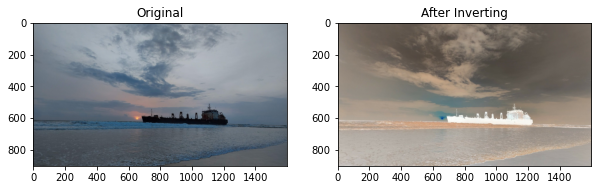

In [29]:
def inverting(orig_img):
    img_inv = 255 - orig_img
    
    fig = plt.figure(figsize=(10, 20))
    ax1 = fig.add_subplot(2, 2, 1)
    ax1.title.set_text('Original')
    ax2 = fig.add_subplot(2, 2, 2)
    ax2.title.set_text("After Inverting")
    ax1.imshow(orig_img)
    ax2.imshow(img_inv)
    
    return img_inv

img_inv = inverting(img)

#### SeperatingRGB:

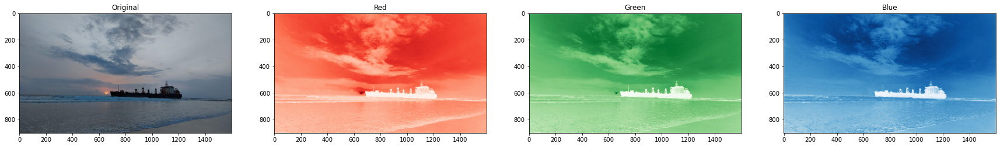

In [30]:
def seperating(orig_img):
    R, G, B = orig_img[:,:,0], orig_img[:,:,1], orig_img[:,:,2]
    
    pixel_matrices = [orig_img]
    pixel_matrices.extend([R, G, B])

    cmap_vals = [None, 'Reds', 'Greens', 'Blues']
    titles = ['Original', 'Red', 'Green', 'Blue']
    fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(30, 30))
    for i, ax in zip(range(4), axes):
        ax.set_title(titles[i])
        ax.imshow(pixel_matrices[i], cmap=cmap_vals[i])
    return True

img_sep = seperating(img)

#### Solarizing:

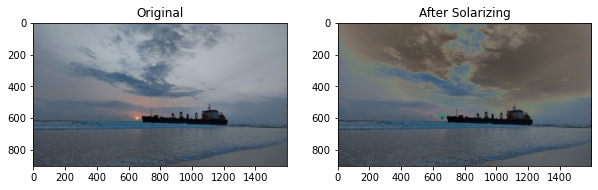

In [32]:
def solarizing(orig_img):
    R, G, B = orig_img[:,:,0], orig_img[:,:,1], orig_img[:,:,2]
    r_sol = np.where((R < 130), R, ~R)
    g_sol = np.where((G < 130), G, ~G)
    b_sol = np.where((B < 130), B, ~B)
    img_sol = np.dstack(tup=(r_sol, g_sol, b_sol))
    
    fig = plt.figure(figsize=(10, 20))
    ax1 = fig.add_subplot(2, 2, 1)
    ax1.title.set_text('Original')
    ax2 = fig.add_subplot(2, 2, 2)
    ax2.title.set_text("After Solarizing")
    ax1.imshow(orig_img)
    ax2.imshow(img_sol)
    
    return img_sol

img_sol = solarizing(img)

#### Binarizing

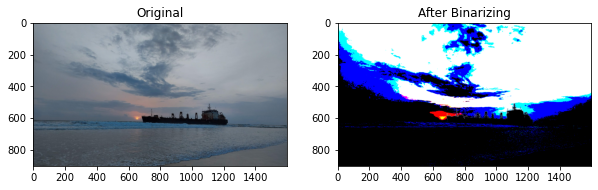

In [33]:
def binarizing(orig_img):
    R, G, B = orig_img[:, :, 0], orig_img[:, :, 1], orig_img[:, :, 2]
    R = np.where((R <= 127), R, 255)
    R = np.where((R > 127), R, 0)
    G = np.where((G <= 127), G, 255)
    G = np.where((G > 127), G, 0)
    B = np.where((B <= 127), B, 255)
    B = np.where((B > 127), B, 0)

    img_bin = np.dstack(tup=(R, G, B))

    fig = plt.figure(figsize=(10, 20))
    ax1 = fig.add_subplot(2, 2, 1)
    ax1.title.set_text('Original')
    ax2 = fig.add_subplot(2, 2, 2)
    ax2.title.set_text("After Binarizing")
    ax1.imshow(orig_img)
    ax2.imshow(img_bin)
    
    return img_bin

img_bin = binarizing(img)

#### Applying above 5 filters on two more images

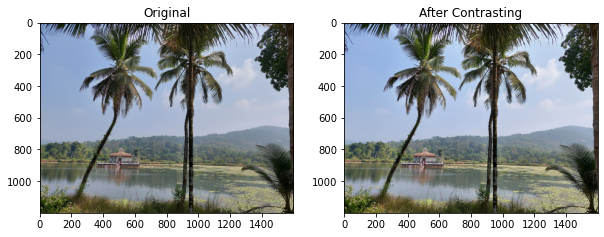

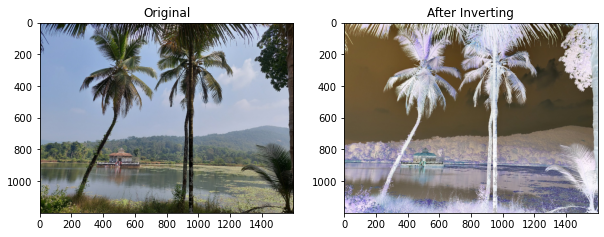

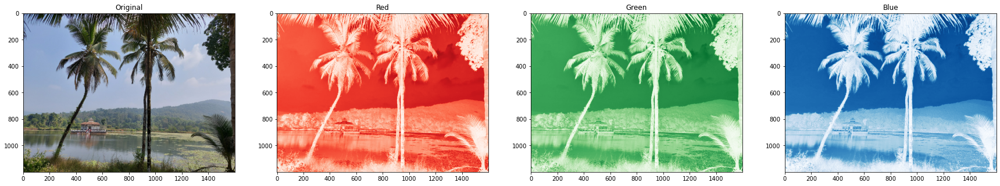

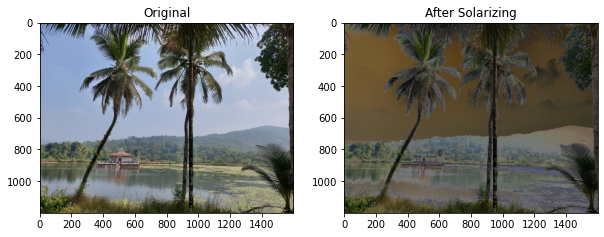

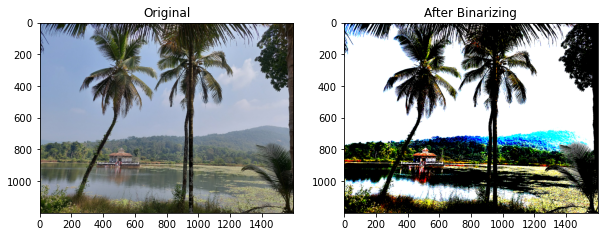

In [34]:
img2 = mpimg.imread('img2.jpg')
img_con = contrasting(img2)
img_inv = inverting(img2)
img_sep = seperating(img2)
img_sol = solarizing(img2)
img_bin = binarizing(img2)

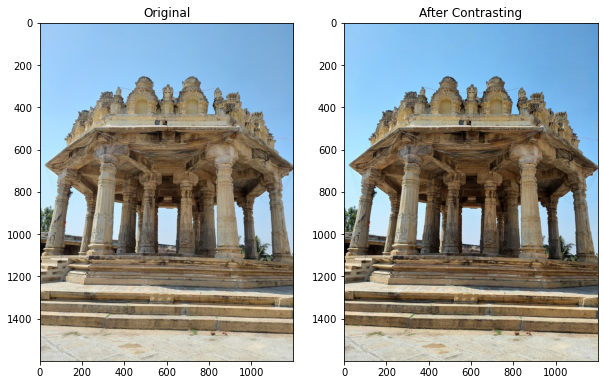

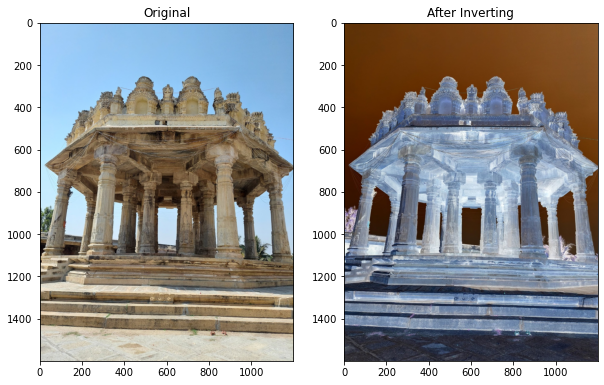

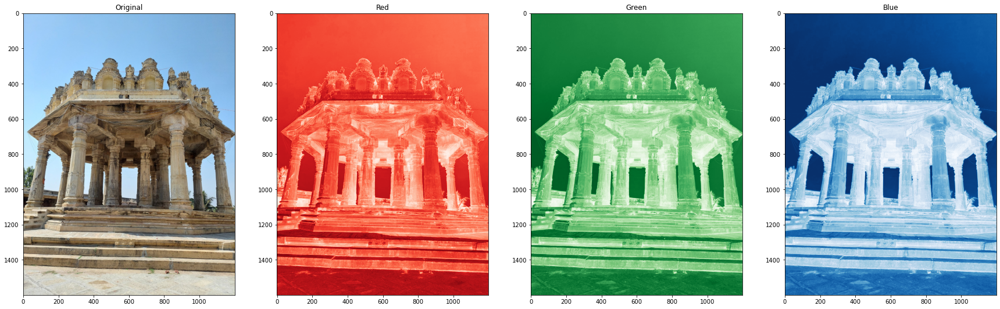

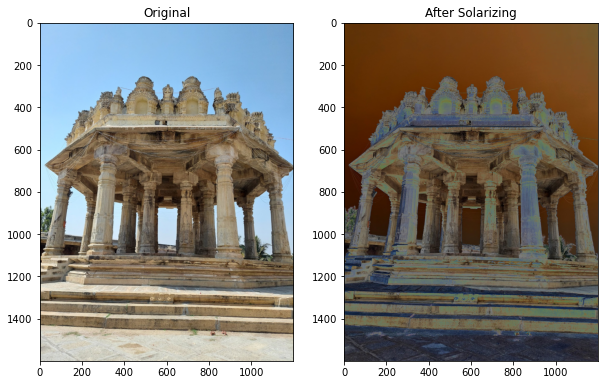

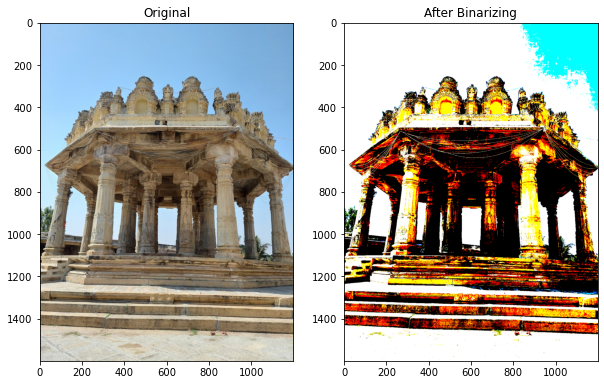

In [35]:
img3 = mpimg.imread('img3.jpg')
img_con = contrasting(img3)
img_inv = inverting(img3)
img_sep = seperating(img3)
img_sol = solarizing(img3)
img_bin = binarizing(img3)

##### Contrasting
In contrast, we can see the colors have been enhanced. It frequently happens that the image that is captured differs from the natural vision. Improving contrast by adjusting the image's pixel values helps to go closer to natural state.

##### Inverting
In image processing, backgrounds are black and objects are white; however, we have the opposite situation, thus we must invert the colours of our image. This often helps in better analysing of the image.

##### SeperatingRGB
Using this, we can see that we have seperated all the layers and plotted them seperately. It might help in some cases where different details can be found in different layers of the photo.

##### Solarizing
Solarizing has made the parts of photo with more light prominent. The term 'solarization' is used to describe the tone-reversal effect that can occur when a camera's photographic film has been severely overexposed. Using a darkroom method, any photograph can be made to appear graphic or surrealistic.

##### Binarization
This, as can be seen above, uses the most extreme values for each pixel of each layer and can be used to find the details that are not very prominent in the photo in its raw form.

## PART 2

In [36]:
img = mpimg.imread('img4.jpg')
r, g, b = img[:,:,0], img[:,:,1], img[:,:,2]
img_gray = 0.2989 * r + 0.5870 * g + 0.1140 * b
im_small = zoom(img, (0.2,0.2,1))

#### Mean Filtering

In [37]:
def convolve_all_colours(im, window):
    ims = []
    for d in range(3):
        im_conv_d = convolve2d(im[:,:,d], window, mode="same", boundary="symm")
        ims.append(im_conv_d)

    im_conv = np.stack(ims, axis=2).astype("uint8")
    
    return im_conv

def make_gaussian_window(n, sigma=1):
    nn = int((n-1)/2)
    a = np.asarray([[x**2 + y**2 for x in range(-nn,nn+1)] for y in range(-nn,nn+1)])
    return np.exp(-a/(2*sigma**2))

def median_filter_all_colours(im_small, window_size):
    ims = []
    for d in range(3):
        im_conv_d = median_filter(im_small[:,:,d], size=(window_size,window_size))
        ims.append(im_conv_d)

    im_conv = np.stack(ims, axis=2).astype("uint8")
    
    return im_conv

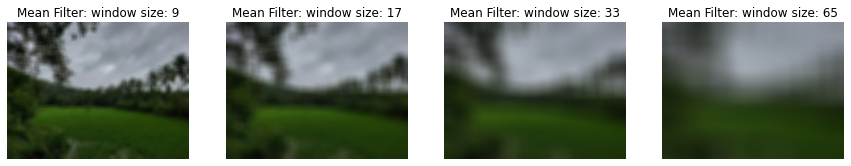

In [38]:
window_sizes = [9,17,33,65]
fig, axs = plt.subplots(nrows=1, ncols=len(window_sizes), figsize=(15,15));

# mean filter
for w, ax in zip(window_sizes, axs):
    window = np.ones((w,w))
    window /= np.sum(window)
    ax.imshow(convolve_all_colours(im_small, window));
    ax.set_title("Mean Filter: window size: {}".format(w));
    ax.set_axis_off();

##### Mean filtering on other two images

In [39]:
img2 = mpimg.imread('img5.jpg')
img3 = mpimg.imread('img6.jpg')
im_small2 = zoom(img2, (0.2,0.2,1))
im_small3 = zoom(img3, (0.2,0.2,1))
r2, g2, b2 = img2[:,:,0], img2[:,:,1], img2[:,:,2]
img_gray2 = 0.2989 * r2 + 0.5870 * g2 + 0.1140 * b2
r3, g3, b3 = img3[:,:,0], img3[:,:,1], img3[:,:,2]
img_gray3 = 0.2989 * r3 + 0.5870 * g3 + 0.1140 * b3

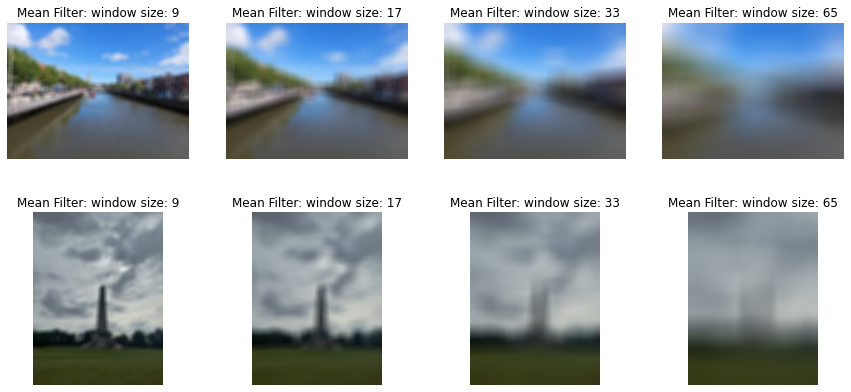

In [40]:
window_sizes = [9,17,33,65]
fig, axs = plt.subplots(nrows=2, ncols=len(window_sizes), figsize=(15,7));

for w, ax in zip(window_sizes, axs[0]):
    window = np.ones((w,w))
    window /= np.sum(window)
    ax.imshow(convolve_all_colours(im_small2, window));
    ax.set_title("Mean Filter: window size: {}".format(w));
    ax.set_axis_off();

for w, ax in zip(window_sizes, axs[1]):
    window = np.ones((w,w))
    window /= np.sum(window)
    ax.imshow(convolve_all_colours(im_small3, window));
    ax.set_title("Mean Filter: window size: {}".format(w));
    ax.set_axis_off();

#### Gaussian Filtering

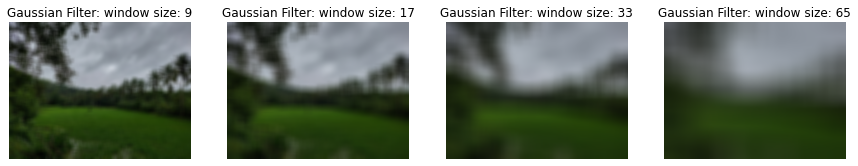

In [41]:
window_sizes = [9,17,33,65]
fig, axs = plt.subplots(nrows=1, ncols=len(window_sizes), figsize=(15,15));

for w, ax in zip(window_sizes, axs):
    window = make_gaussian_window(w,sigma=w)
    window /= np.sum(window)
    ax.imshow(convolve_all_colours(im_small, window));
    ax.set_title("Gaussian Filter: window size: {}".format(w));
    ax.set_axis_off();

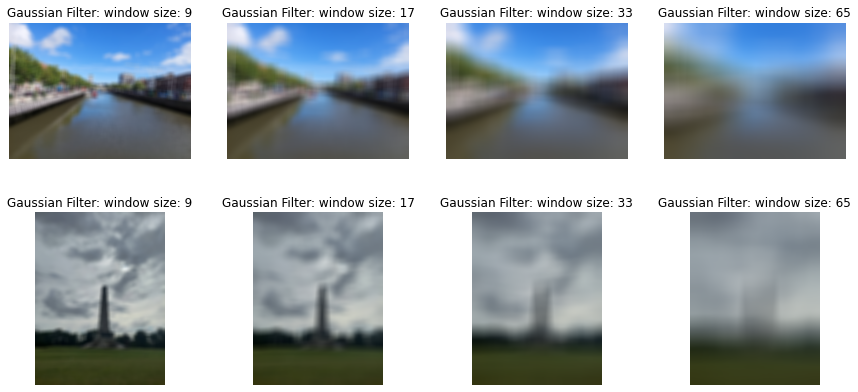

In [18]:
window_sizes = [9,17,33,65]
fig, axs = plt.subplots(nrows=2, ncols=len(window_sizes), figsize=(15,7));

for w, ax in zip(window_sizes, axs[0]):
    window = make_gaussian_window(w,sigma=w)
    window /= np.sum(window)
    ax.imshow(convolve_all_colours(im_small2, window));
    ax.set_title("Gaussian Filter: window size: {}".format(w));
    ax.set_axis_off();

for w, ax in zip(window_sizes, axs[1]):
    window = make_gaussian_window(w,sigma=w)
    window /= np.sum(window)
    ax.imshow(convolve_all_colours(im_small3, window));
    ax.set_title("Gaussian Filter: window size: {}".format(w));
    ax.set_axis_off();

#### Median Filtering

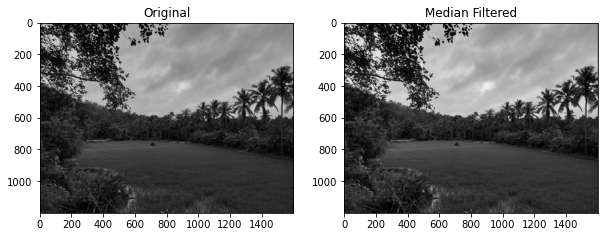

In [44]:
# window_sizes = [9,17,33,65]
# fig, axs = plt.subplots(nrows=1, ncols=len(window_sizes), figsize=(15,15));

# for w, ax in zip(window_sizes, axs):
#     ax.imshow(median_filter_all_colours(im_small, w));
#     ax.set_title("Median Filter: window size: {}".format(w));
#     ax.set_axis_off();

def median_filter(orig_img, filter_size):
    temp = []
    indexer = filter_size // 2
    data_final = []
    data_final = np.zeros((len(orig_img),len(orig_img[0])))
    for i in range(len(orig_img)):

        for j in range(len(orig_img[0])):

            for z in range(filter_size):
                if i + z - indexer < 0 or i + z - indexer > len(orig_img) - 1:
                    for c in range(filter_size):
                        temp.append(0)
                else:
                    if j + z - indexer < 0 or j + indexer > len(orig_img[0]) - 1:
                        temp.append(0)
                    else:
                        for k in range(filter_size):
                            temp.append(orig_img[i + z - indexer][j + k - indexer])

            temp.sort()
            data_final[i][j] = temp[len(temp) // 2]
            temp = []
    
    fig = plt.figure(figsize=(10, 20))
    ax1 = fig.add_subplot(2, 2, 1)
    ax1.title.set_text('Original')
    ax2 = fig.add_subplot(2, 2, 2)
    ax2.title.set_text("Median Filtered")
    ax1.imshow(orig_img, cmap='gray')
    ax2.imshow(data_final, cmap='gray')
    plt.show()
    
median_filter(img_gray, 3)

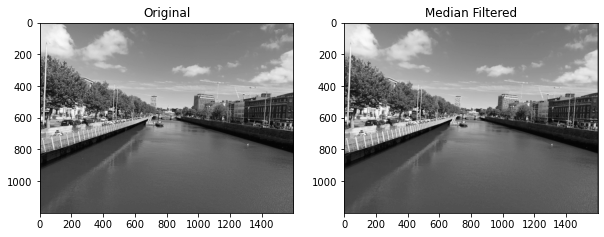

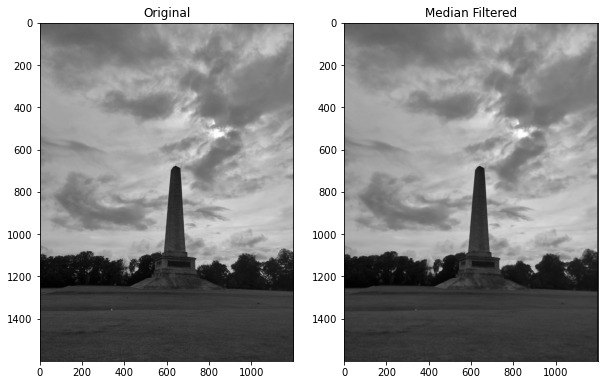

In [45]:
median_filter(img_gray2, 4)
median_filter(img_gray3, 6)

#### Sobel Filter

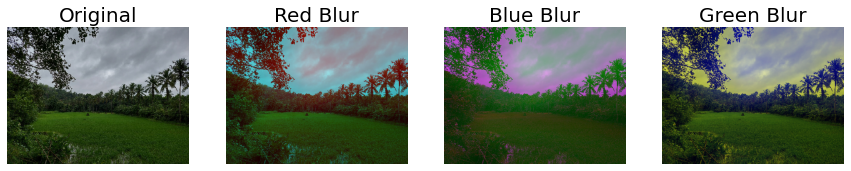

In [22]:
fig, axs = plt.subplots(nrows=1, ncols=4, figsize=(15,5))

ax= axs[0]
ax.imshow(im_small)
ax.set_title("Original", fontsize=20)
ax.set_axis_off()

w=75
window = np.ones((w,w))
window /= np.sum(window)

ax= axs[1]
ims = []
for d in range(3):
    if d == 0:
        im_conv_d = convolve2d(im_small[:,:,d],window, mode="same", boundary="symm")
    else:
        im_conv_d = im_small[:,:,d]
    ims.append(im_conv_d)
ax.imshow(np.stack(ims, axis=2).astype("uint8"))
ax.set_title("Red Blur", fontsize=20)
ax.set_axis_off()

ax= axs[2]
ims = []
for d in range(3):
    if d == 1:
        im_conv_d = convolve2d(im_small[:,:,d], window, mode="same", boundary="symm")
    else:
        im_conv_d = im_small[:,:,d]
    ims.append(im_conv_d)
ax.imshow(np.stack(ims, axis=2).astype("uint8"))
ax.set_title("Blue Blur", fontsize=20)
ax.set_axis_off()

ax= axs[3]
ims = []
for d in range(3):
    if d == 2:
        im_conv_d = convolve2d(im_small[:,:,d], window, mode="same", boundary="symm")
    else:
        im_conv_d = im_small[:,:,d]
    ims.append(im_conv_d)
ax.imshow(np.stack(ims, axis=2).astype("uint8"))
ax.set_title("Green Blur", fontsize=20)
ax.set_axis_off()

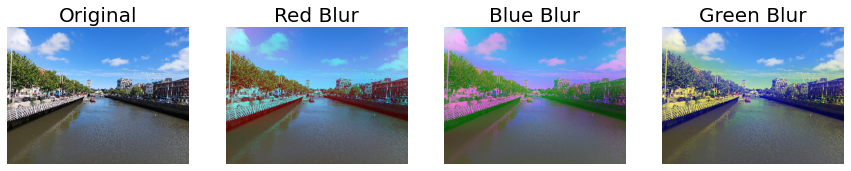

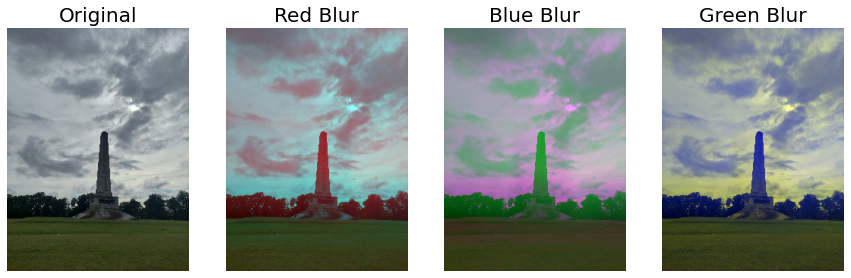

In [23]:
fig, axs = plt.subplots(nrows=1, ncols=4, figsize=(15,5))

ax= axs[0]
ax.imshow(im_small2)
ax.set_title("Original", fontsize=20)
ax.set_axis_off()

w=75
window = np.ones((w,w))
window /= np.sum(window)

ax= axs[1]
ims = []
for d in range(3):
    if d == 0:
        im_conv_d = convolve2d(im_small2[:,:,d],window, mode="same", boundary="symm")
    else:
        im_conv_d = im_small2[:,:,d]
    ims.append(im_conv_d)
ax.imshow(np.stack(ims, axis=2).astype("uint8"))
ax.set_title("Red Blur", fontsize=20)
ax.set_axis_off()

ax= axs[2]
ims = []
for d in range(3):
    if d == 1:
        im_conv_d = convolve2d(im_small2[:,:,d], window, mode="same", boundary="symm")
    else:
        im_conv_d = im_small2[:,:,d]
    ims.append(im_conv_d)
ax.imshow(np.stack(ims, axis=2).astype("uint8"))
ax.set_title("Blue Blur", fontsize=20)
ax.set_axis_off()

ax= axs[3]
ims = []
for d in range(3):
    if d == 2:
        im_conv_d = convolve2d(im_small2[:,:,d], window, mode="same", boundary="symm")
    else:
        im_conv_d = im_small2[:,:,d]
    ims.append(im_conv_d)
ax.imshow(np.stack(ims, axis=2).astype("uint8"))
ax.set_title("Green Blur", fontsize=20)
ax.set_axis_off()

fig, axs = plt.subplots(nrows=1, ncols=4, figsize=(15,5))

ax= axs[0]
ax.imshow(im_small3)
ax.set_title("Original", fontsize=20)
ax.set_axis_off()

w=75
window = np.ones((w,w))
window /= np.sum(window)

ax= axs[1]
ims = []
for d in range(3):
    if d == 0:
        im_conv_d = convolve2d(im_small3[:,:,d],window, mode="same", boundary="symm")
    else:
        im_conv_d = im_small3[:,:,d]
    ims.append(im_conv_d)
ax.imshow(np.stack(ims, axis=2).astype("uint8"))
ax.set_title("Red Blur", fontsize=20)
ax.set_axis_off()

ax= axs[2]
ims = []
for d in range(3):
    if d == 1:
        im_conv_d = convolve2d(im_small3[:,:,d], window, mode="same", boundary="symm")
    else:
        im_conv_d = im_small3[:,:,d]
    ims.append(im_conv_d)
ax.imshow(np.stack(ims, axis=2).astype("uint8"))
ax.set_title("Blue Blur", fontsize=20)
ax.set_axis_off()

ax= axs[3]
ims = []
for d in range(3):
    if d == 2:
        im_conv_d = convolve2d(im_small3[:,:,d], window, mode="same", boundary="symm")
    else:
        im_conv_d = im_small3[:,:,d]
    ims.append(im_conv_d)
ax.imshow(np.stack(ims, axis=2).astype("uint8"))
ax.set_title("Green Blur", fontsize=20)
ax.set_axis_off()

#### Local Binary Pattern FIltering

In [24]:
def get_neighbors_pixel(image: np.ndarray, x_coordinate: int, y_coordinate: int, center: int) -> int:

    try:
        return int(image[x_coordinate][y_coordinate] >= center)
    except (IndexError, TypeError):
        return 0

def local_binary_value(image: np.ndarray, x_coordinate: int, y_coordinate: int) -> int:

    center = image[x_coordinate][y_coordinate]
    powers = [1, 2, 4, 8, 16, 32, 64, 128]

    # skip get_neighbors_pixel if center is null
    if center is None:
        return 0

    # Starting from the top right, assigning value to pixels clockwise
    binary_values = [get_neighbors_pixel(image, x_coordinate - 1, y_coordinate + 1, center),
                     get_neighbors_pixel(image, x_coordinate, y_coordinate + 1, center),
                     get_neighbors_pixel(image, x_coordinate - 1, y_coordinate, center),
                     get_neighbors_pixel(image, x_coordinate + 1, y_coordinate + 1, center),
                     get_neighbors_pixel(image, x_coordinate + 1, y_coordinate, center),
                     get_neighbors_pixel(image, x_coordinate + 1, y_coordinate - 1, center),
                     get_neighbors_pixel(image, x_coordinate, y_coordinate - 1, center),
                     get_neighbors_pixel(image, x_coordinate - 1, y_coordinate - 1, center)]

    # Converting the binary value to decimal.
    return sum(binary_value * power for binary_value, power in zip(binary_values, powers))

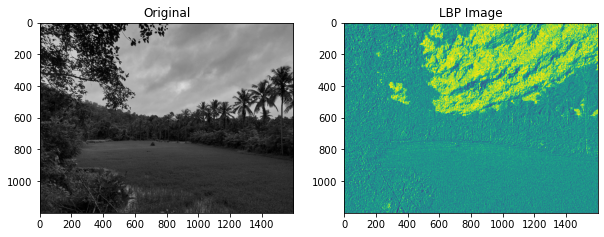

In [25]:
lbp_image = np.zeros((img_gray.shape[0], img_gray.shape[1]))

for i in range(0, img_gray.shape[0]):
        for j in range(0, img_gray.shape[1]):
            lbp_image[i][j] = local_binary_value(img_gray, i, j)
            
fig = plt.figure(figsize=(10, 20))

ax1 = fig.add_subplot(1, 2, 1)
ax1.title.set_text('Original')
ax1.imshow(img_gray, cmap='gray')
ax2 = fig.add_subplot(1, 2, 2)
ax2.title.set_text('LBP Image')
ax2.imshow(lbp_image)

plt.show()

In [27]:
r2, g2, b2 = img2[:,:,0], img2[:,:,1], img2[:,:,2]
img_gray2 = 0.2989 * r2 + 0.5870 * g2 + 0.1140 * b2

r3, g3, b3 = img3[:,:,0], img3[:,:,1], img3[:,:,2]
img_gray3 = 0.2989 * r3 + 0.5870 * g3 + 0.1140 * b3

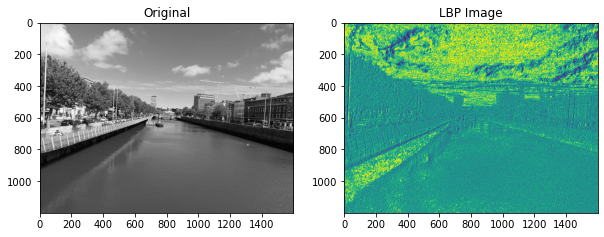

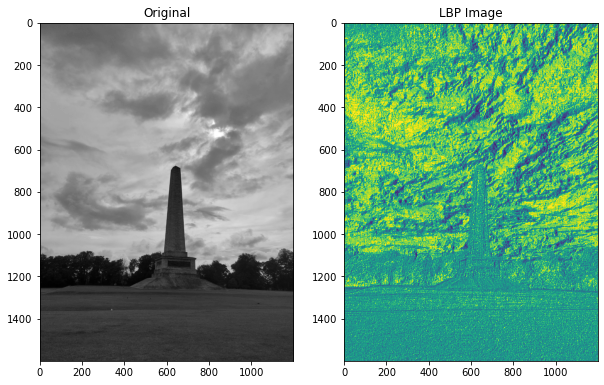

In [28]:
lbp_image = np.zeros((img_gray2.shape[0], img_gray2.shape[1]))

for i in range(0, img_gray2.shape[0]):
        for j in range(0, img_gray2.shape[1]):
            lbp_image[i][j] = local_binary_value(img_gray2, i, j)
            
fig = plt.figure(figsize=(10, 20))
ax1 = fig.add_subplot(1, 2, 1)
ax1.title.set_text('Original')
ax1.imshow(img_gray2, cmap='gray')
ax2 = fig.add_subplot(1, 2, 2)
ax2.title.set_text('LBP Image')
ax2.imshow(lbp_image)
plt.show()

lbp_image = np.zeros((img_gray3.shape[0], img_gray3.shape[1]))

for i in range(0, img_gray3.shape[0]):
        for j in range(0, img_gray3.shape[1]):
            lbp_image[i][j] = local_binary_value(img_gray3, i, j)
            
fig = plt.figure(figsize=(10, 20))
ax1 = fig.add_subplot(1, 2, 1)
ax1.title.set_text('Original')
ax1.imshow(img_gray3, cmap='gray')
ax2 = fig.add_subplot(1, 2, 2)
ax2.title.set_text('LBP Image')
ax2.imshow(lbp_image)
plt.show()

##### Mean Filtering
Mean filtering is simple, intuitive and easy to implement method of smoothing images. As we can see here that it is reducing the amount of intensity variation between one pixel and the next.

##### Gaussian Filtering
It is also working as an smoothening technique. It is doing that by using a weighted average of surrounding pixels based on the Gaussian distribution.

##### Median Filtering
Another smoothening filter, which is more effective than mean when the goal is to simultaneously reduce noise and preserve edges.

##### Sobel Filtering
It is a low pass filter, which is a gradient operator that captures focus information. It can be used for edge detection

##### Local Binary Patterns
The Local Binary Pattern (LBP) texturing operator labels the pixels in an image by thresholding the area around each pixel and taking the result into account as a binary integer. LBP texture operator has gained popularity in many applications due to its strong discriminative ability and computational simplicity.

## PART 3

#### Fourier Transformation (Vertical)

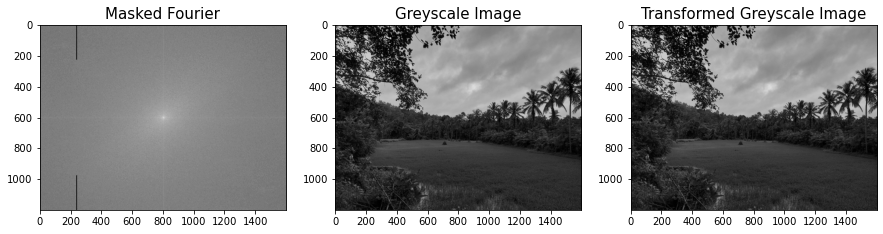

In [30]:
def fourier_masker_v(image, i):
    f_size = 15
    dark_image_grey_fourier = np.fft.fftshift(np.fft.fft2(image))
    dark_image_grey_fourier[:225, 235:240] = i
    dark_image_grey_fourier[-225:,235:240] = i
    fig, ax = plt.subplots(1,3,figsize=(15,15))
    ax[0].imshow(np.log(abs(dark_image_grey_fourier)), cmap='gray')
    ax[0].set_title('Masked Fourier', fontsize = f_size)
    ax[1].imshow(image, cmap = 'gray')
    ax[1].set_title('Greyscale Image', fontsize = f_size);
    ax[2].imshow(abs(np.fft.ifft2(dark_image_grey_fourier)), cmap='gray')
    ax[2].set_title('Transformed Greyscale Image', fontsize = f_size);
    
fourier_masker_v(img_gray, 1)

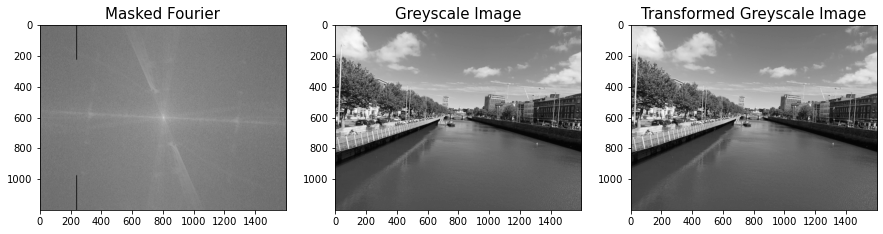

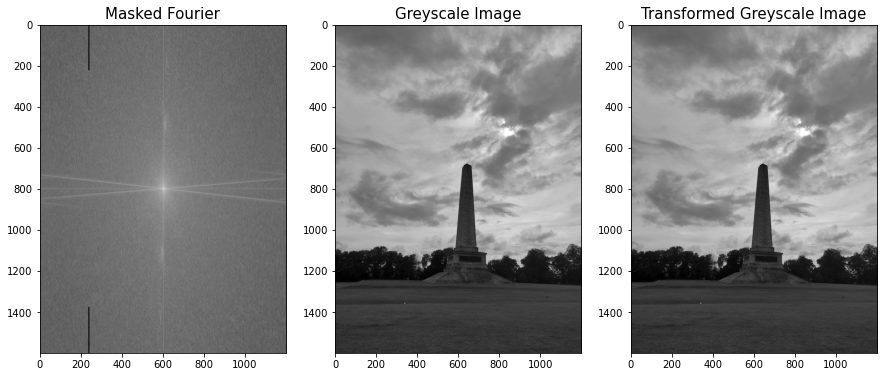

In [31]:
fourier_masker_v(img_gray2, 1)
fourier_masker_v(img_gray3, 1)

#### Fourier Transformation (Horizontal)

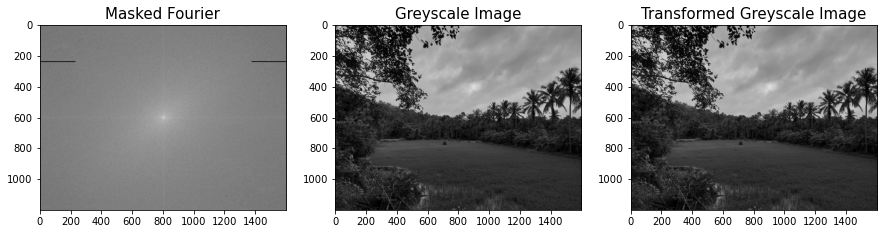

In [32]:
def fourier_masker_h(image, i):
    f_size = 15
    dark_image_grey_fourier = np.fft.fftshift(np.fft.fft2(image))
    dark_image_grey_fourier[235:240, :230] = i
    dark_image_grey_fourier[235:240,-230:] = i
    fig, ax = plt.subplots(1,3,figsize=(15,15))
    ax[0].imshow(np.log(abs(dark_image_grey_fourier)), cmap='gray')
    ax[0].set_title('Masked Fourier', fontsize = f_size)
    ax[1].imshow(image, cmap = 'gray')
    ax[1].set_title('Greyscale Image', fontsize = f_size);
    ax[2].imshow(abs(np.fft.ifft2(dark_image_grey_fourier)), cmap='gray')
    ax[2].set_title('Transformed Greyscale Image', fontsize = f_size);
    
fourier_masker_h(img_gray, 1)

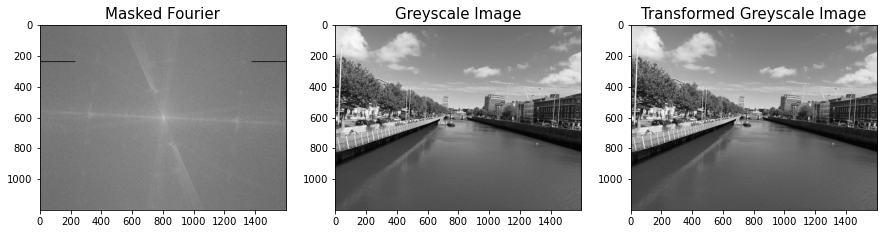

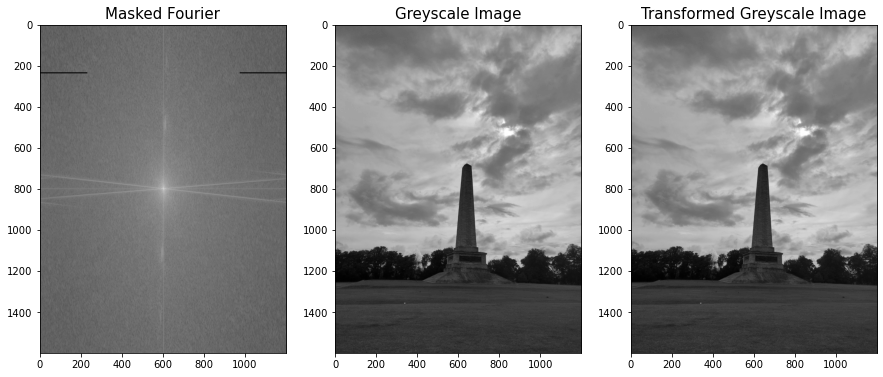

In [33]:
fourier_masker_h(img_gray2, 1)
fourier_masker_h(img_gray3, 1)

#### Low Pass Blurring

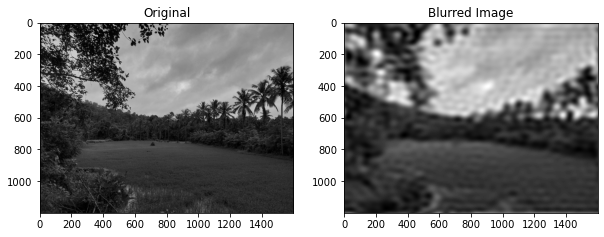

In [34]:
def blur(gray_img):
    image1_np=np.array(gray_img)

    #fft of image
    fft1 = fftpack.fftshift(fftpack.fft2(image1_np))

    #Create a low pass filter image
    x,y = image1_np.shape[0],image1_np.shape[1]
    #size of circle
    e_x,e_y=50,50
    #create a box 
    bbox=((x/2)-(e_x/2),(y/2)-(e_y/2),(x/2)+(e_x/2),(y/2)+(e_y/2))

    low_pass=Image.new("L",(image1_np.shape[0],image1_np.shape[1]),color=0)

    draw1=ImageDraw.Draw(low_pass)
    draw1.ellipse(bbox, fill=1)

    low_pass_np=np.array(low_pass)

    #multiply both the images
    filtered=np.multiply(fft1,low_pass_np.T)

    #inverse fft
    ifft2 = np.real(fftpack.ifft2(fftpack.ifftshift(filtered)))
    ifft2 = np.maximum(0, np.minimum(ifft2, 255))
    
    fig = plt.figure(figsize=(10, 20))
    ax1 = fig.add_subplot(1, 2, 1)
    ax1.title.set_text('Original')
    ax1.imshow(gray_img, cmap='gray')
    ax2 = fig.add_subplot(1, 2, 2)
    ax2.title.set_text('Blurred Image')
    ax2.imshow(ifft2, cmap='gray')
    plt.show()

blur(img_gray)

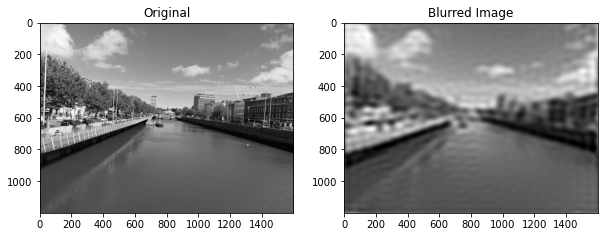

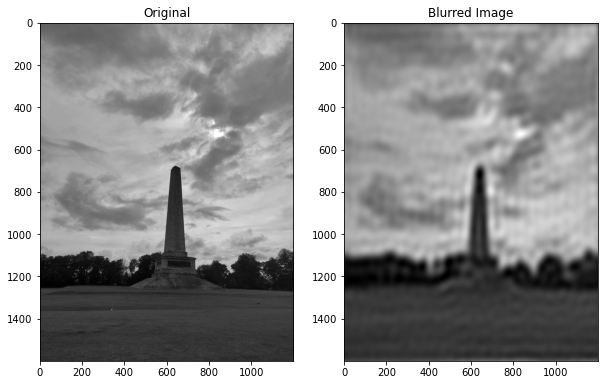

In [35]:
blur(img_gray2)
blur(img_gray3)

#### Subsampling

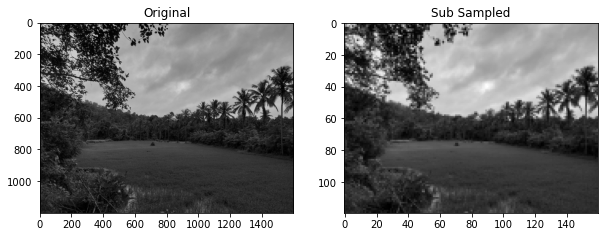

In [36]:
def sub_sample(gray_img, factor):
    assert isinstance(factor, int), type(factor)
    sx, sy = gray_img.shape
    X, Y = np.ogrid[0:sx, 0:sy]
    regions = sy//factor * (X//factor) + Y//factor
    res = ndimage.mean(gray_img, labels=regions, index=np.arange(regions.max() + 1))
    res.shape = (sx//factor, sy//factor)
    
    fig = plt.figure(figsize=(10, 20))
    ax1 = fig.add_subplot(1, 2, 1)
    ax1.title.set_text('Original')
    ax1.imshow(gray_img, cmap='gray')
    ax2 = fig.add_subplot(1, 2, 2)
    ax2.title.set_text('Sub Sampled')
    ax2.imshow(res, cmap='gray')
    plt.show()
    
sub_sample(img_gray, 10)

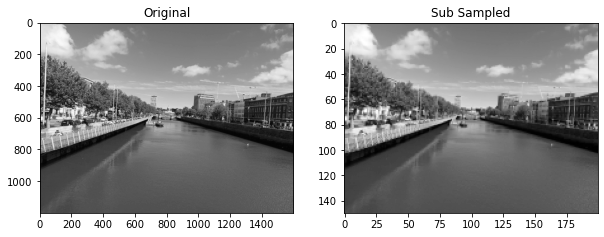

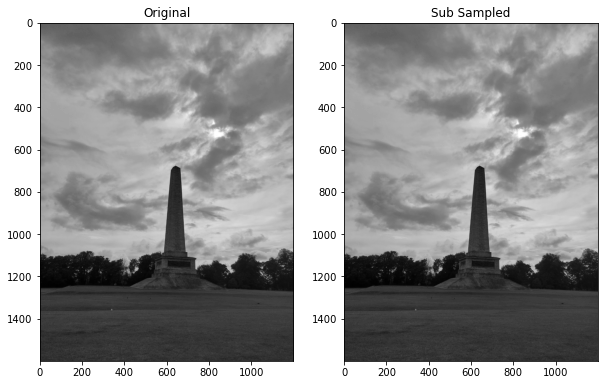

In [37]:
sub_sample(img_gray2, 8)
sub_sample(img_gray3, 1)

#### Gamma Correction

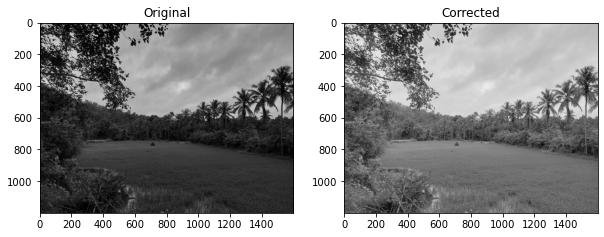

In [38]:
def gammaCorrection(gray_img, gamma):
    out = np.power(gray_img.copy(), gamma)
    
    fig = plt.figure(figsize=(10, 20))
    ax1 = fig.add_subplot(1, 2, 1)
    ax1.title.set_text('Original')
    ax1.imshow(gray_img, cmap='gray')
    ax2 = fig.add_subplot(1, 2, 2)
    ax2.title.set_text('Corrected')
    ax2.imshow(out, cmap='gray')
    
    plt.show()
    
gammaCorrection(img_gray,0.5)

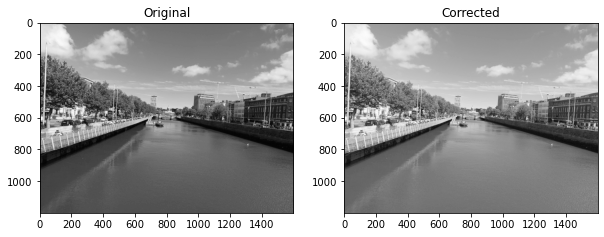

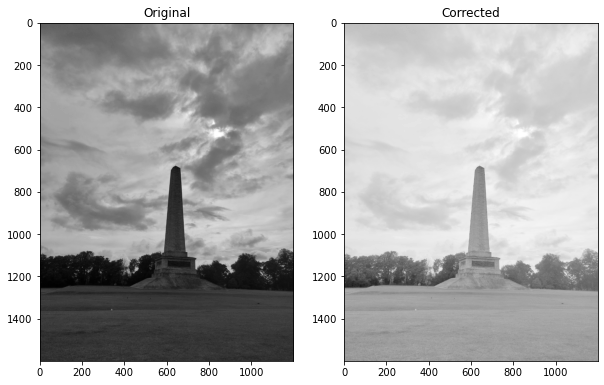

In [39]:
gammaCorrection(img_gray2, 0.7)
gammaCorrection(img_gray3, 0.2)

##### Fourier Transformation(Vertical)
It has increased the effect of vertical componets of the image by reducing the effect of horizontal components.

##### Fourier Transformation(Horizontal)
It has made the horizontal components of the image more prominent.

##### Low Pass Blurring
A low-pass filter, also called a "blurring" or "smoothing" filter, averages out rapid changes in intensity.

##### Subsampling
It reduced image resolution by the given factor and can be used to sample image data when the volume of data is too big to process in raw form.

##### Gamma Correction
It has controlled the overall brightness of an image. It can be used with images that are found to be either bleached out or too dark.